In [34]:
import mujoco_py
import numpy as np
import matplotlib.pyplot as plt
from mujoco_parser import *
from util import *
from util_fk import *
import cv2

np.set_printoptions(precision=2)
plt.rc('xtick',labelsize=6); plt.rc('ytick',labelsize=6)
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
print ("Ready.")

Ready.


In [35]:
env = MuJoCoParserClass(name='UR5e',xml_path='../asset/ur5e/UR5_rg2_gripper.xml')
print ("[%s] parsed."%(env.name))

[UR5e] parsed.


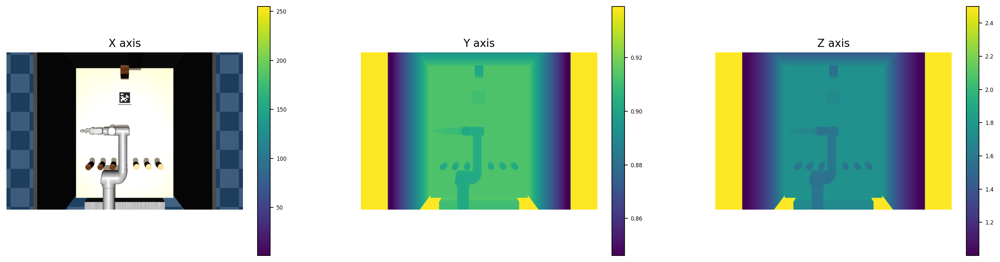

In [36]:
# Up-right table view.
cam_infos = env.set_cam_infos(cam_distance  = 0.0,
                    cam_azimuth   = 0,        # Z-axis: Yaw
                    cam_elevation = -90,      # X-axis: Roll                        
                    cam_lookat    = [1.0, 0.0, 2.5])  # arbitrary offset on camera.

# update object, robot configurations
env.forward(INCREASE_TICK=False)

for _ in range(2):
    img = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")
    img_depth = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=True, camera_name="track")
    img_real = np.array(env.depth2meters(img_depth))

plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.imshow(img); plt.axis('off')
plt.title("X axis")
plt.colorbar()

plt.subplot(1,3,2)
plt.imshow(img_depth); plt.axis('off')
plt.title("Y axis")
plt.colorbar()

plt.subplot(1,3,3)
plt.imshow(img_real); plt.axis('off')
plt.title("Z axis")
plt.colorbar()
plt.show()

this is the rotational informations: [-178.81  -31.47  179.39]


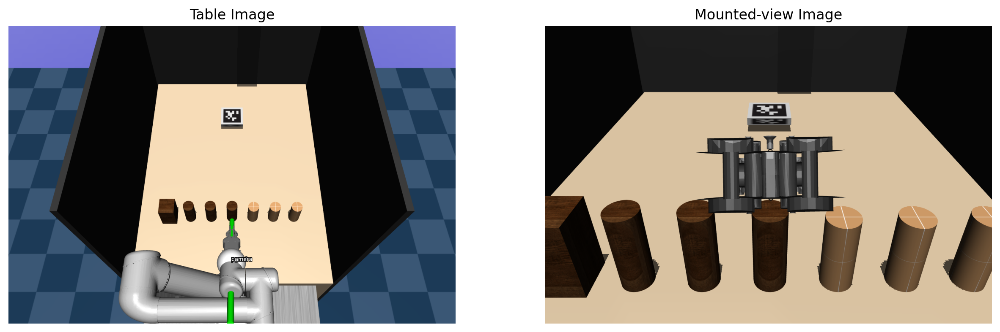

this is the rotational informations: [ 179.71  -26.16 -179.88]


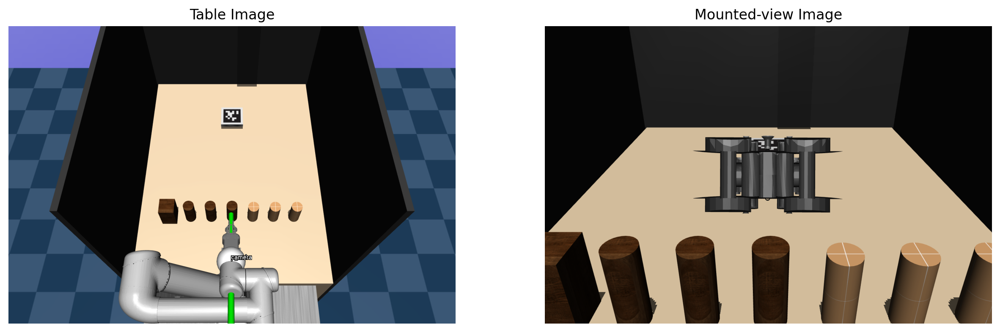

this is the rotational informations: [ 178.87  -21.43 -179.6 ]


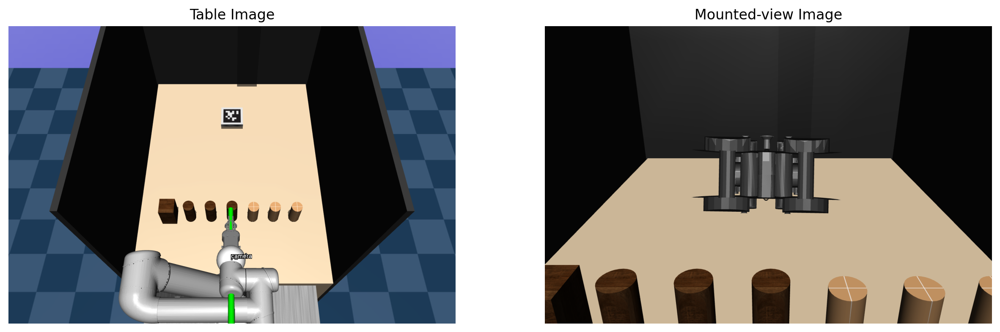

this is the rotational informations: [ 178.43  -17.14 -179.55]


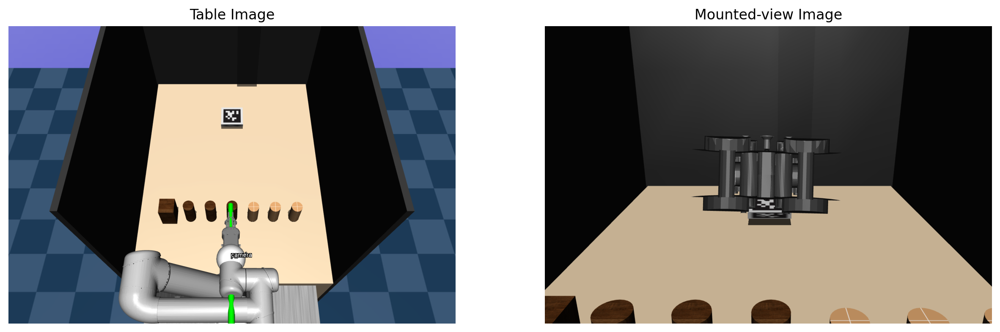

this is the rotational informations: [ 178.18  -13.08 -179.6 ]


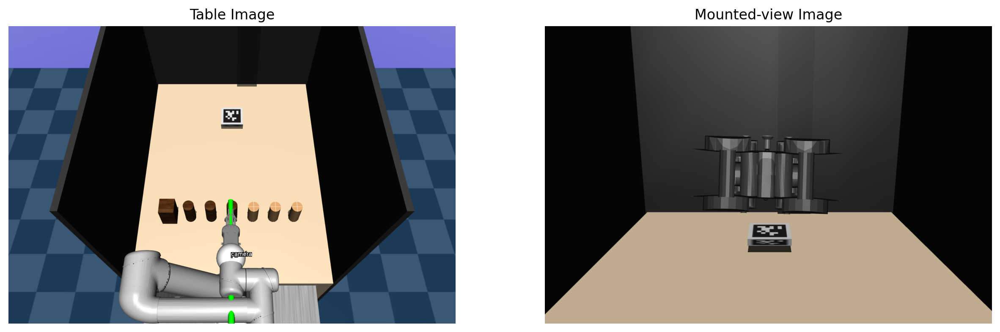

this is the rotational informations: [ 178.04   -9.17 -179.69]


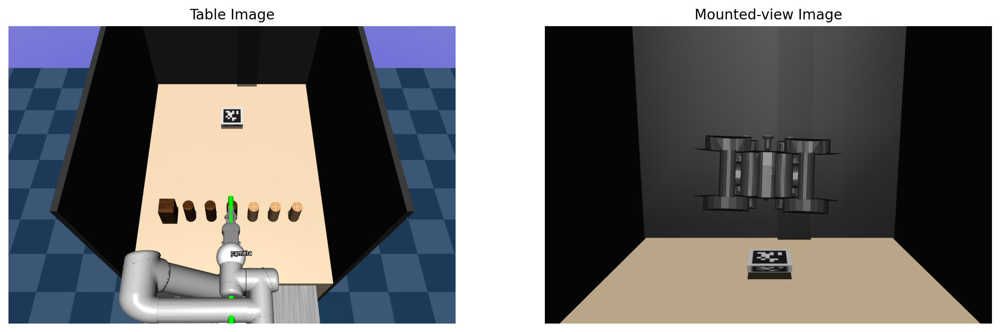

this is the rotational informations: [ 177.99   -5.39 -179.81]


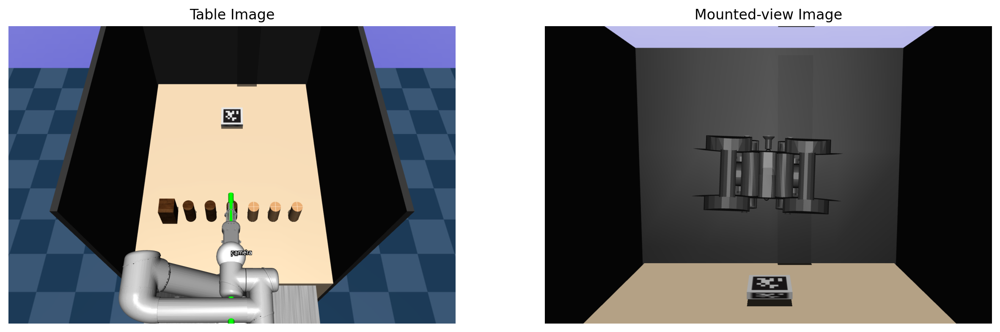

this is the rotational informations: [ 177.98   -1.69 -179.93]


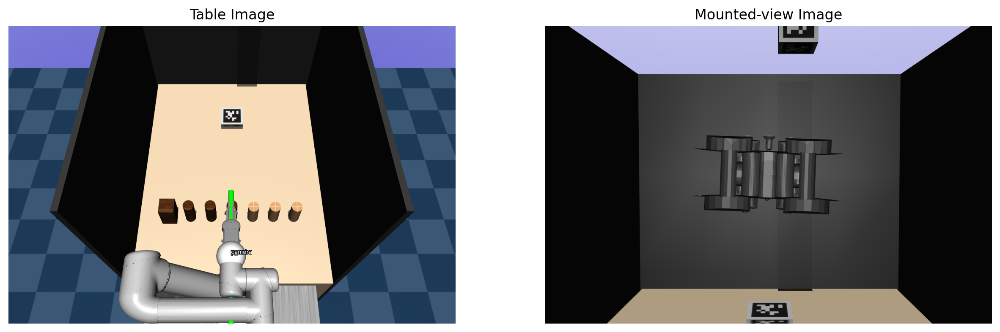

this is the rotational informations: [177.96   2.03 179.94]


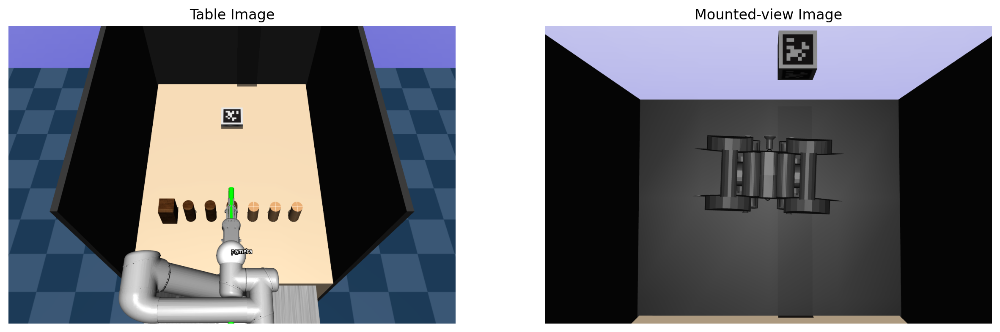

this is the rotational informations: [ 179.71    3.   -180.  ]


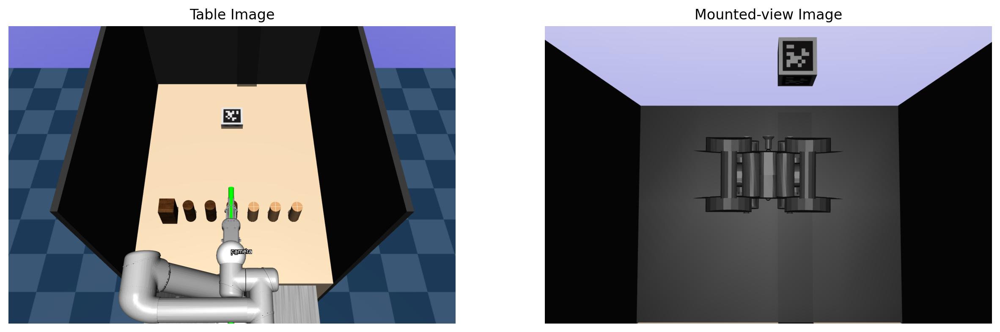

In [38]:
import math

rpy_list = []
r_list = []
eef_list = []

# delete all the markers.
del env.viewer._markers[:]

# Check available objects whose names start with 'obj_'
# Set objects behind of apriltag
obj_names = get_env_obj_names(env,prefix='obj_') # see objects

for obj_idx,obj_name in enumerate(obj_names):
    obj_pos   = [0.7,-0.3+0.1*obj_idx,0.8]
    obj_quat  = [0,0,0,1]
    set_env_obj(env=env,obj_name=obj_name,obj_pos=obj_pos,obj_quat=obj_quat,obj_color=None)

# Set AprilTag configurations
april_addr_z = env.sim.model.get_joint_qpos_addr('box_checker_z')
env.sim.data.qpos[april_addr_z] = -math.pi/2

max_tick = 10
env.tick = 0

while env.tick < max_tick:
    # Set Joint Configurations
    init_configurations = [-math.pi/2, -3*math.pi/4, 3*math.pi/4, math.pi/2, math.pi/6-0.02*env.tick*math.pi, -math.pi/2 ]
    set_env_joint_configuration(env, init_configurations, prefix='ur_')

    # update object, robot configurations
    env.step()
    env.forward(INCREASE_TICK=False)

    # Get pose what I want to attach on.
    # Get e.e. pose.
    p_eef = env.get_p_body("ur_rg2_gripper_base_link")
    R_eef = env.get_R_body("ur_rg2_gripper_base_link")
    eef_list.append(p_eef)
    
    # p_eef = env.get_p_body("ur_rg2_gripper_base_link")
    # R_eef = env.get_R_body("ur_rg2_gripper_base_link")
    R_y = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,1,0]))
    R_z = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,0,1]))
    r_list.append(R_z)

    R_y_rpy = r2rpy(R_y, unit='deg')
    R_z_rpy = r2rpy(R_z, unit='deg')
    R_coord    = R_eef # rpy2r(np.deg2rad([0,0,0]))

    print(f"this is the rotational informations: {R_y_rpy}")
    rpy_list.append(R_y_rpy)
    
    env.viewer.add_marker(
        pos   = p_eef,
        type  = mujoco_py.generated.const.GEOM_CYLINDER,
        size  = [0.01,0.01,0.5/2],
        mat   = R_z,
        rgba  = [0.0,1.0,0.0,0.9],
        label = 'p_eef'
    )

    env.add_marker_sphere(p=p_eef,radius=0.05,rgba=[1.0,1.0,1.0,1.0],label='camera')

    # Arbitrary offset on camera btw arm.
    # arbi_offset = [0.05, 0, 0.05]
    arbi_offset = [0.0, 0, 0]

    # View Up-right the table.
    cam_table = env.set_cam_infos(cam_distance  = 1.0,
                        cam_azimuth   = 0,   # Z-axis: Yaw
                        cam_elevation = -60,      # X-axis: Roll                        
                        cam_lookat    = [0.5, 0, 1.5])  # arbitrary offset on camera.

    for _ in range(5):
        img_table = env.render_scene(mode='rgb_array', cam_infos=cam_table, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.imshow(img_table); plt.axis('off')
    plt.title("Table Image")
    
    R_eef_rpy = r2rpy(R_eef, unit='deg')

    # Follow Robot E.E.
    # cam_infos = env.set_cam_infos(cam_distance  = 0.1,
    #                     cam_azimuth   = R_z_rpy[2]-90,      # Z-axis: Yaw
    #                     cam_elevation = R_z_rpy[1],         # X-axis: Roll                        
    #                     cam_lookat    = p_eef+arbi_offset)  # arbitrary offset on camera.
    # Follow Robot E.E.
    cam_infos = env.set_cam_infos(cam_distance  = 0.05,
                        cam_azimuth   = R_eef_rpy[2]+90,      # Z-axis: Yaw
                        cam_elevation = R_eef_rpy[0]+90,         # X-axis: Roll                        
                        cam_lookat    = p_eef+arbi_offset)  # arbitrary offset on camera.

    # update object, robot configurations
    env.forward(INCREASE_TICK=False)

    for _ in range(2):
        img = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")
        img_depth = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=True, camera_name="track")
        img_real = np.array(env.depth2meters(img_depth))

    plt.subplot(1,2,2)
    plt.imshow(img); plt.axis('off')
    plt.title("Mounted-view Image")
    plt.show()

    # delete all the markers.
    del env.viewer._markers[:]


In [ ]:
eef_list

[array([0.36, 0.  , 1.14]),
 array([0.36, 0.  , 1.14]),
 array([0.36, 0.  , 1.15]),
 array([0.36, 0.  , 1.15]),
 array([0.37, 0.  , 1.16]),
 array([0.37, 0.  , 1.16]),
 array([0.37, 0.  , 1.17]),
 array([0.37, 0.  , 1.17]),
 array([0.37, 0.  , 1.18]),
 array([0.37, 0.  , 1.18])]

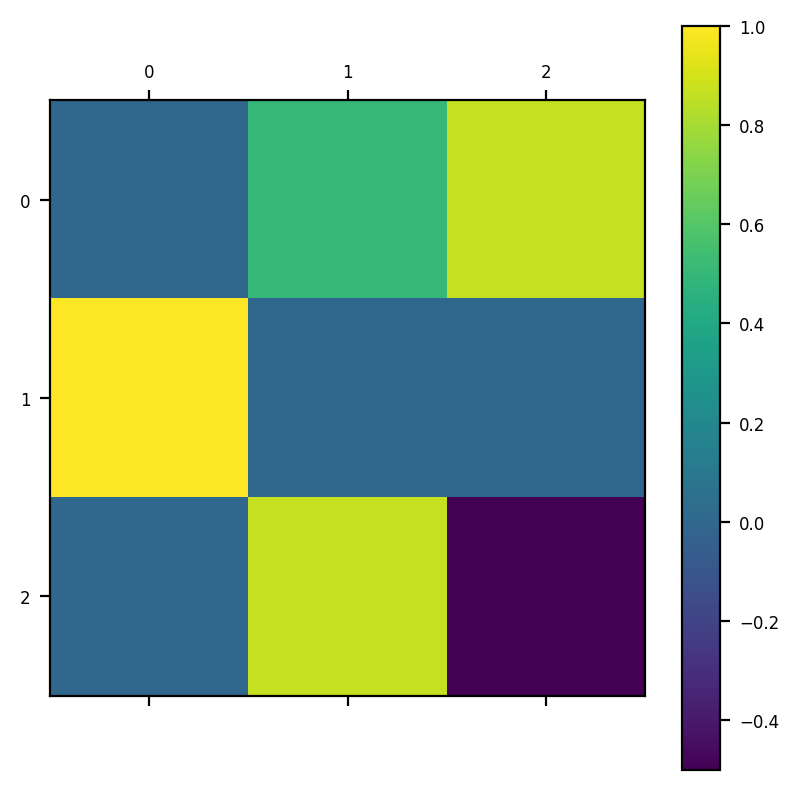

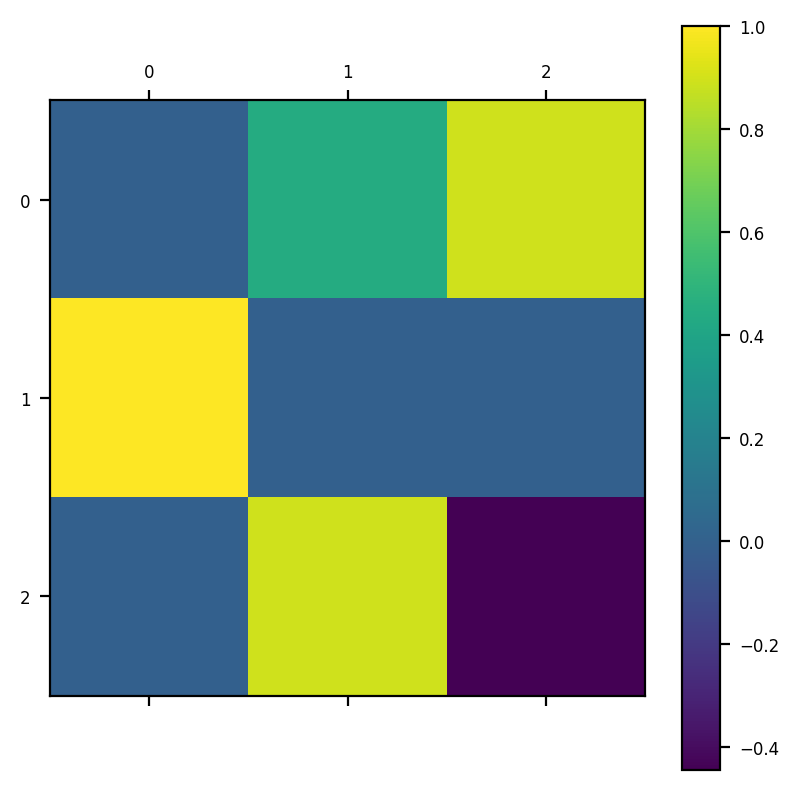

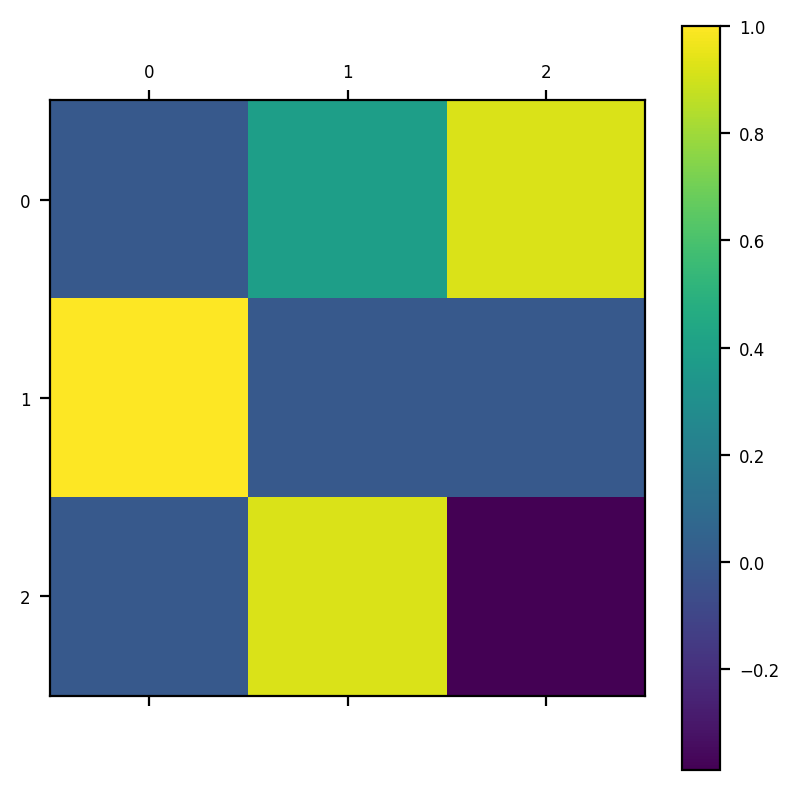

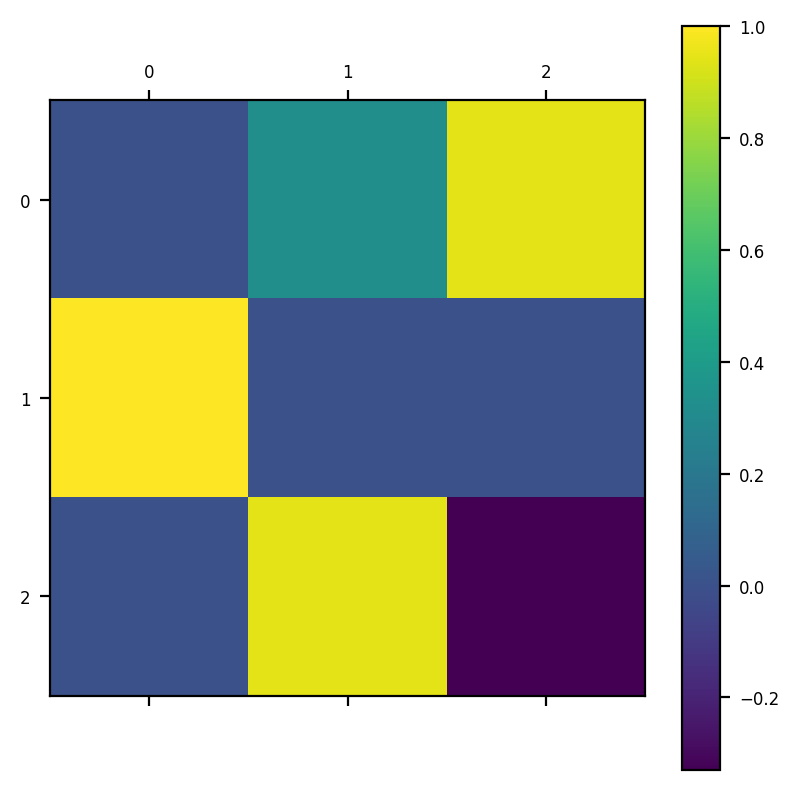

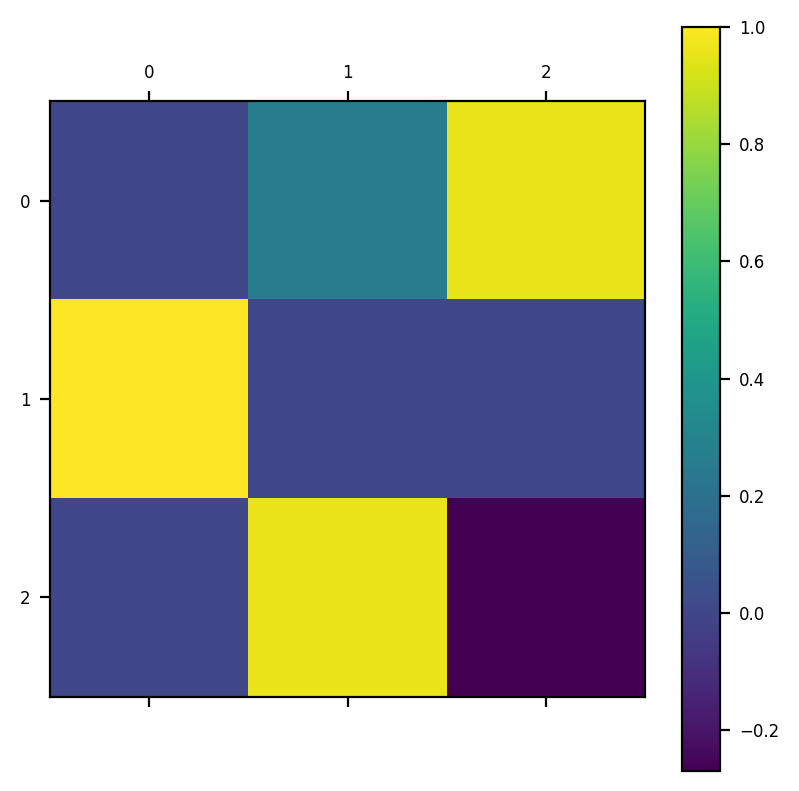

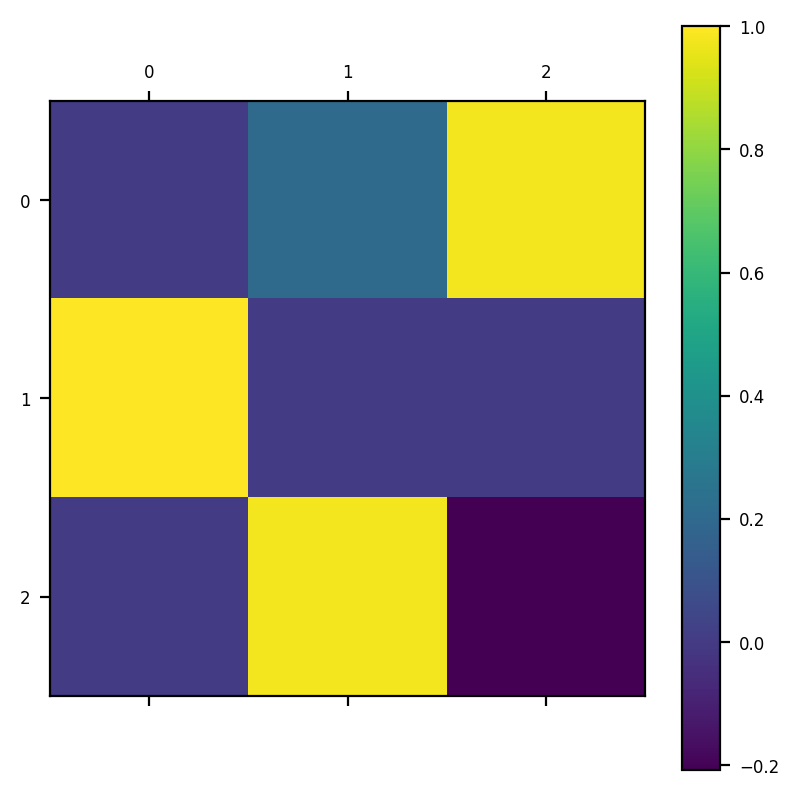

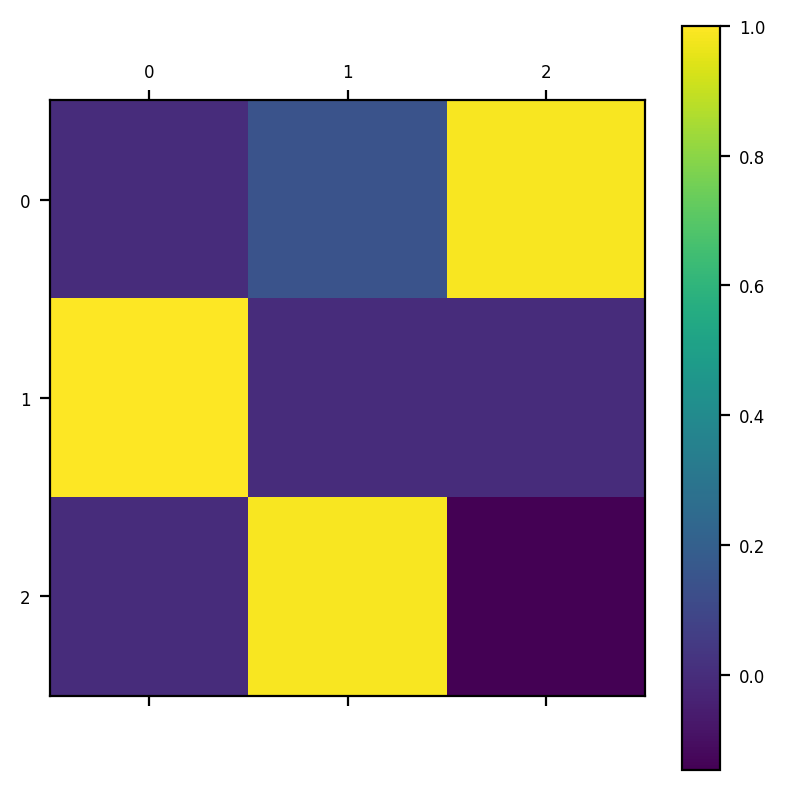

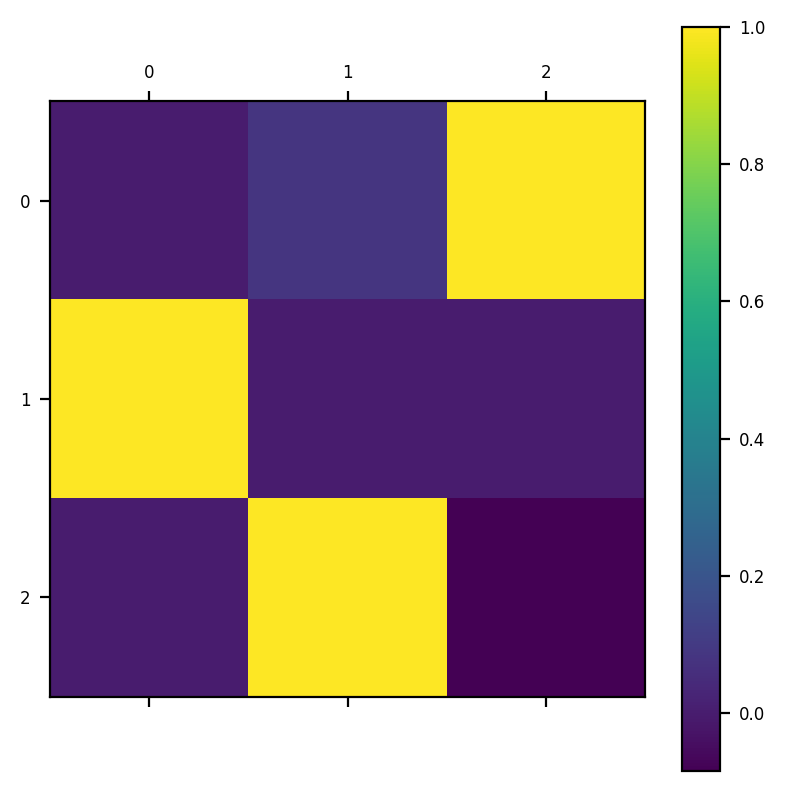

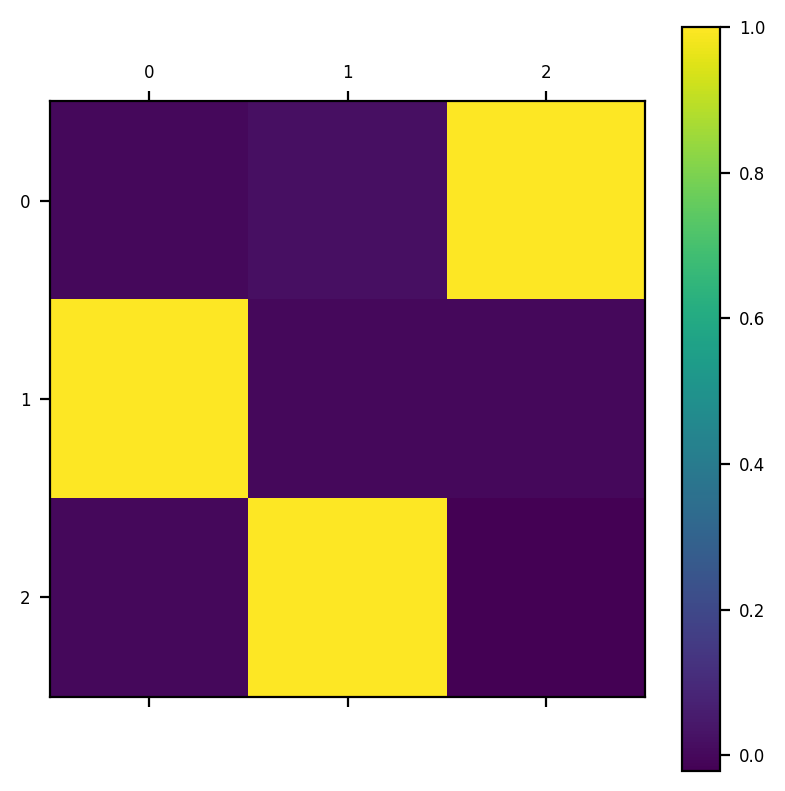

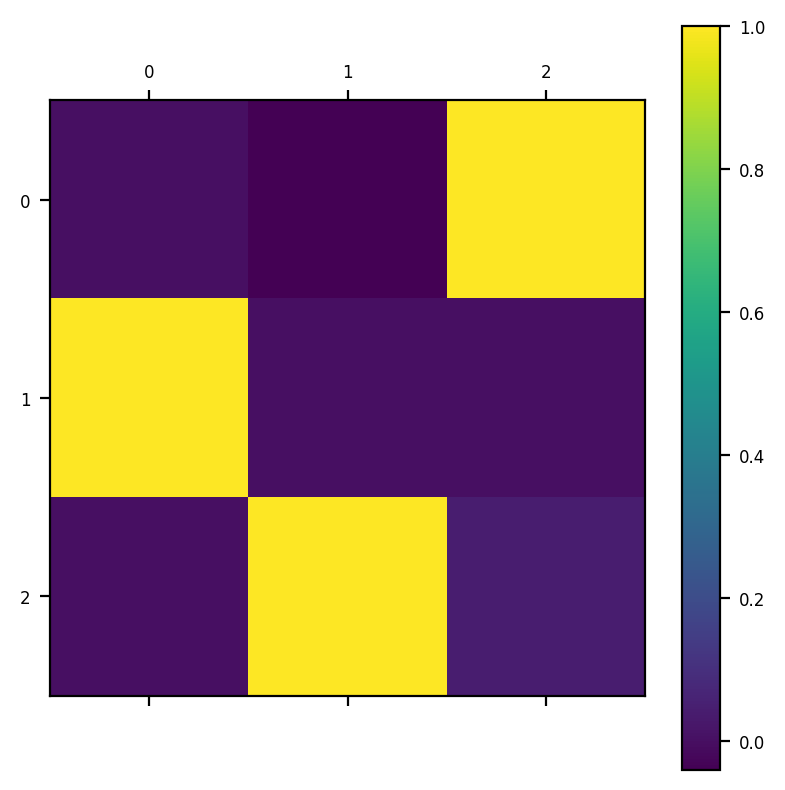

In [ ]:
for i in range(10):
    plt.matshow(r_list[i])
    plt.colorbar()

In [ ]:
rpy_list_test = [r2rpy(r_list[i], unit='deg') for i in range(10)]
rpy_list_test

[array([1.20e+02, 6.07e-15, 9.00e+01]),
 array([1.16e+02, 9.46e-15, 9.00e+01]),
 array([1.13e+02, 1.60e-14, 9.00e+01]),
 array([1.09e+02, 9.81e-15, 9.00e+01]),
 array([1.06e+02, 1.95e-14, 9.00e+01]),
 array([1.02e+02, 1.96e-14, 9.00e+01]),
 array([9.84e+01, 1.33e-14, 9.00e+01]),
 array([9.48e+01, 6.99e-15, 9.00e+01]),
 array([9.12e+01, 1.97e-14, 9.00e+01]),
 array([8.76e+01, 7.01e-15, 9.00e+01])]

In [ ]:
rpy_list

[array([-180.  ,  -30.05, -180.  ]),
 array([-180.  ,  -26.45,  180.  ]),
 array([-180.  ,  -22.85, -180.  ]),
 array([-180.  ,  -19.25,  180.  ]),
 array([-180.  ,  -15.65,  180.  ]),
 array([-180.  ,  -12.05, -180.  ]),
 array([-180.  ,   -8.45, -180.  ]),
 array([-180.  ,   -4.85, -180.  ]),
 array([-180.  ,   -1.25, -180.  ]),
 array([-180.  ,    2.35, -180.  ])]

In [ ]:
env.sim_state = env.sim.get_state()

In [ ]:
R = np.array(env.sim.data.body_xmat[env.body_name2idx("ur_rg2_gripper_base_link")].reshape([3, 3]))
R


array([[ 3.62e-04,  5.25e-02,  9.99e-01],
       [-1.00e+00,  5.03e-03,  9.71e-05],
       [-5.02e-03, -9.99e-01,  5.25e-02]])

In [ ]:
r2rpy(R, unit='deg')

array([-86.99,   0.29, -89.98])

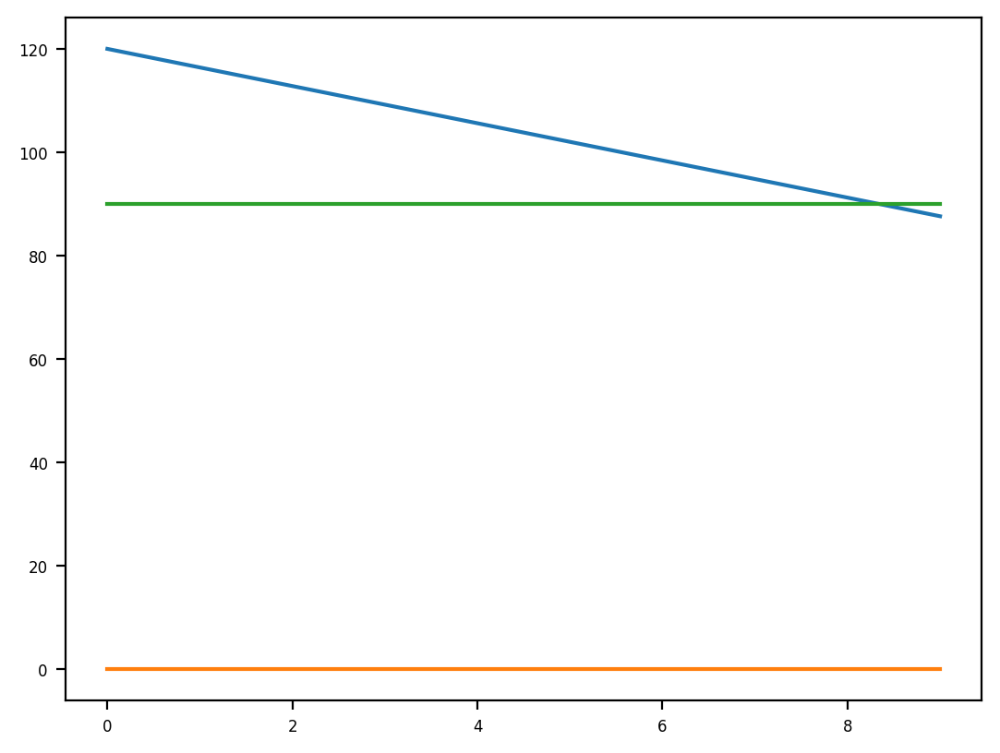

In [ ]:
plt.plot(rpy_list_test)
plt.show()

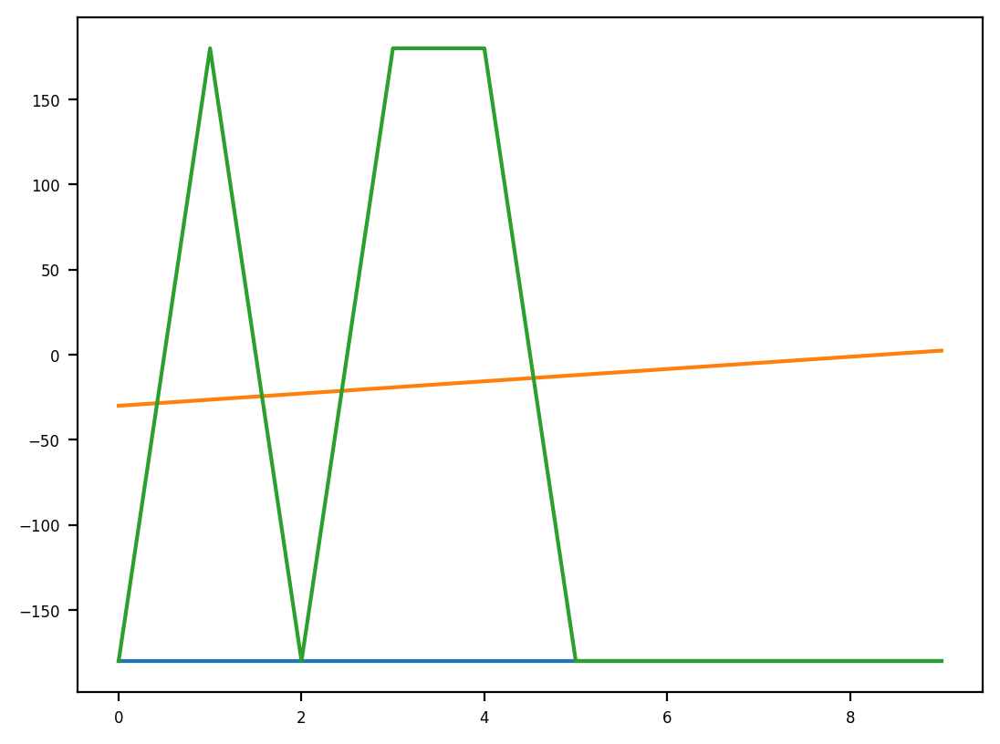

In [ ]:
plt.plot(rpy_list)
plt.show()

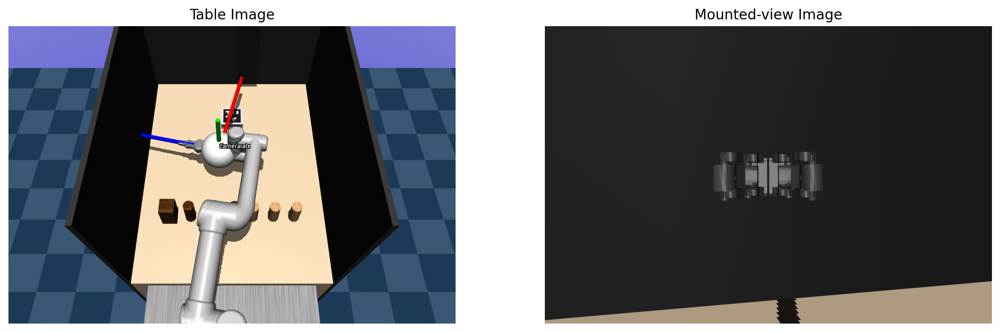

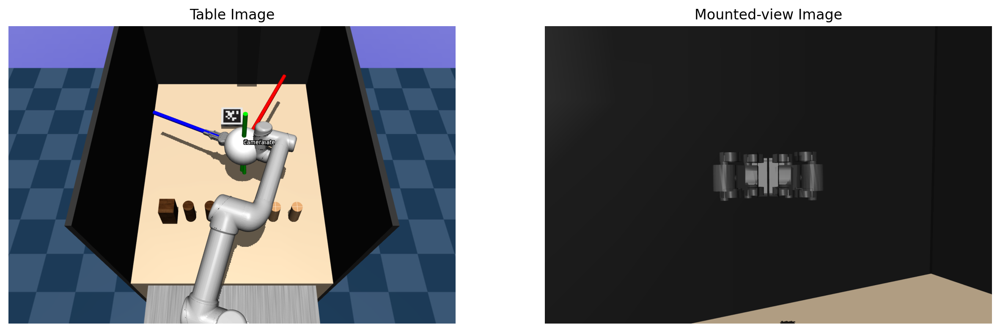

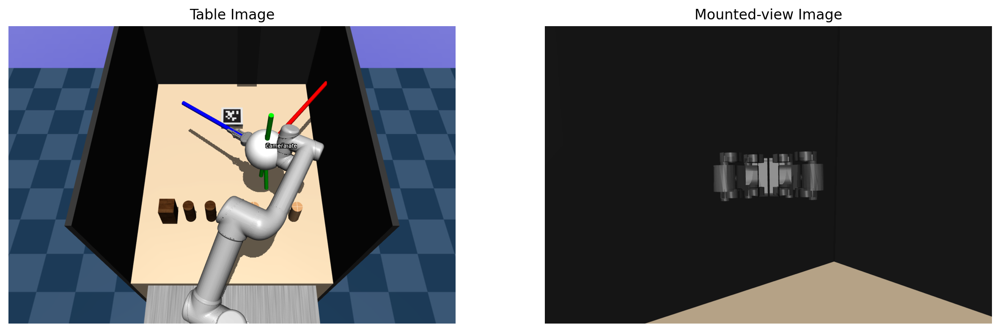

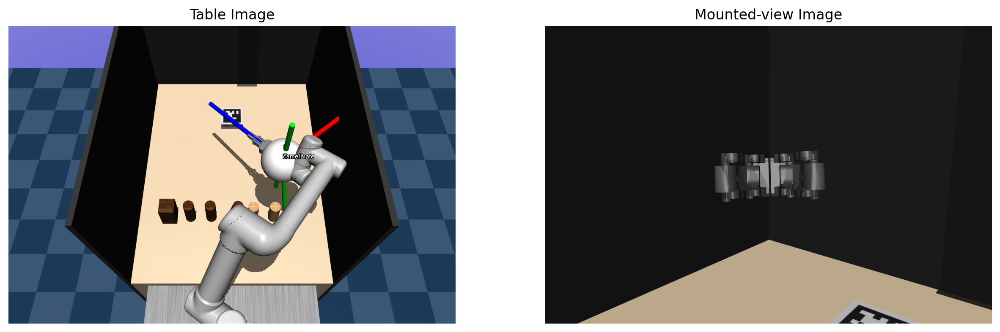

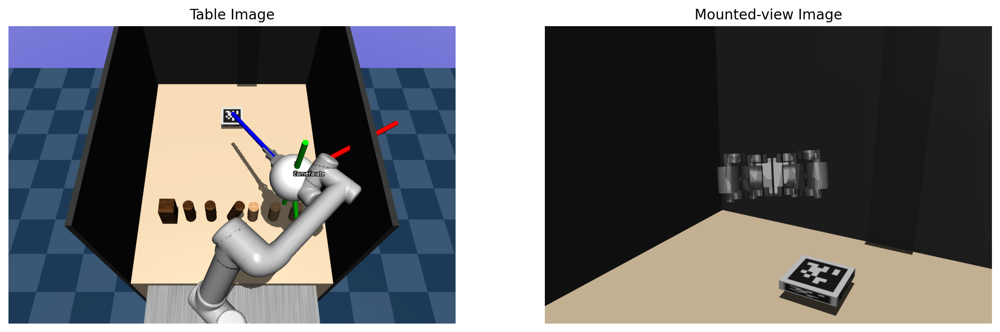

...

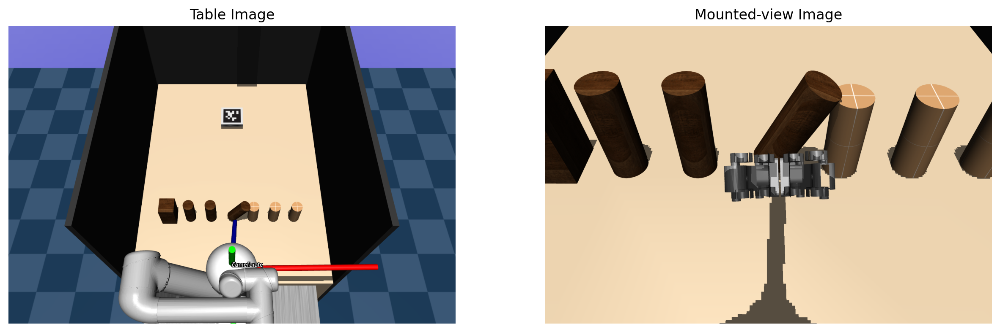

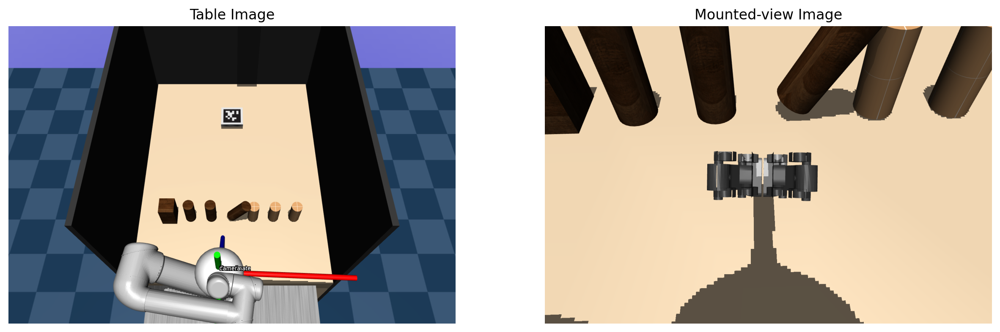

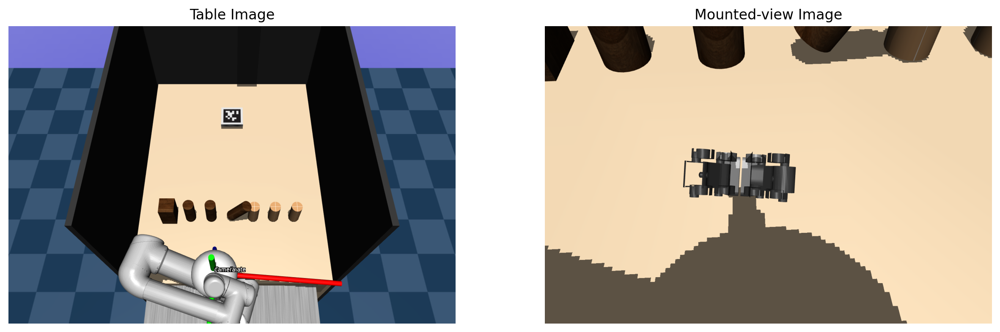

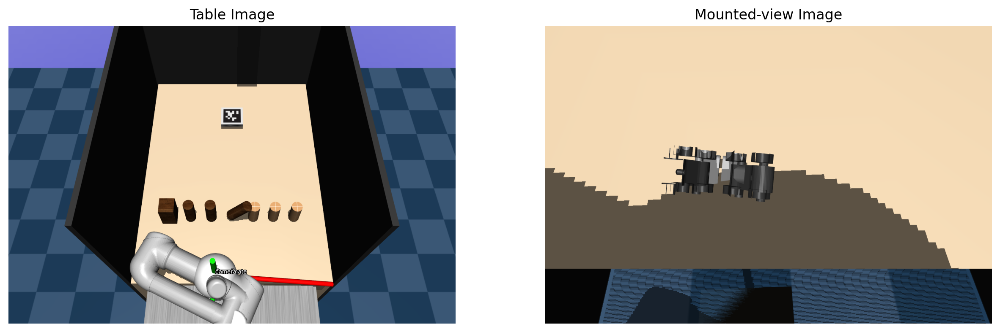

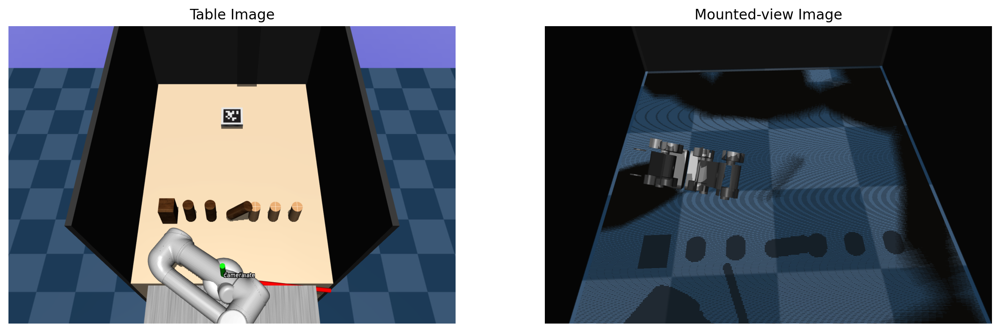

In [ ]:
import math

# delete all the markers.
del env.viewer._markers[:]

# Check available objects whose names start with 'obj_'
# Set objects behind of apriltag
obj_names = get_env_obj_names(env,prefix='obj_') # see objects

for obj_idx,obj_name in enumerate(obj_names):
    obj_pos   = [0.7,-0.3+0.1*obj_idx,0.8]
    obj_quat  = [0,0,0,1]
    set_env_obj(env=env,obj_name=obj_name,obj_pos=obj_pos,obj_quat=obj_quat,obj_color=None)

# Set AprilTag configurations
april_addr_z = env.sim.model.get_joint_qpos_addr('box_checker_z')
env.sim.data.qpos[april_addr_z] = -math.pi/2

max_tick = 10
env.tick = 0

init_configurations = [0, 0, 0, 0, 0, 0]
set_env_joint_configuration(env, init_configurations, prefix='ur_')

# Extrinsic calbration list
tagpose_list = []
bs2ee_list = []

# update object, robot configurations
env.step()

while env.tick < max_tick:
    # Set Joint Configurations
    init_configurations = [-math.pi/2*0.1*env.tick, -3*math.pi/4*0.1*env.tick, 3*math.pi/4*0.1*env.tick, math.pi/2*0.1*env.tick, math.pi/4*0.1*env.tick, -math.pi/2*0.1*env.tick ]
    set_env_joint_configuration(env, init_configurations, prefix='ur_')

    # update object, robot configurations
    env.step()
    env.forward(INCREASE_TICK=False)
    
    env.sim_state = env.sim.get_state()
    p_eef = np.array(env.sim.data.body_xpos[env.body_name2idx("ur_rg2_gripper_base_link")])    

    # Get pose what I want to attach on.
    # Get wrist pose.
    # p_eef = env.get_p_body("ur_rg2_gripper_base_link")
    R_eef = env.get_R_body("ur_rg2_gripper_base_link")
    R_z = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,0,1]))
    R_coord    = R_eef # rpy2r(np.deg2rad([0,0,0]))
    env.add_marker_coordinate(
        p=p_eef,R=R_coord,axis_len=0.5,axis_width=0.01,label='Coordinate')

    env.add_marker_sphere(p=p_eef,radius=0.09,rgba=[1.0,1.0,1.0,1.0],label='camera')

    env.viewer.add_marker(
        pos   = p_eef,
        type  = mujoco_py.generated.const.GEOM_CYLINDER,
        size  = [0.01,0.01,0.5/2],
        mat   = R_y,
        rgba  = [0.0,1.0,0.0,0.9],
        label = ''
    )

    R_z_rpy = np.degrees(r2rpy(R_z))
    
    # Arbitrary offset on camera btw arm.
    # arbi_offset = [0.05, 0, 0.10]
    arbi_offset = [0.0, 0.0, 0.0]

    # View Up-right the table.
    cam_table = env.set_cam_infos(cam_distance  = 1.0,
                        cam_azimuth   = 0,   # Z-axis: Yaw
                        cam_elevation = -60,      # X-axis: Roll                        
                        cam_lookat    = [0.5, 0, 1.5])  # arbitrary offset on camera.

    for _ in range(5):
        img_table = env.render_scene(mode='rgb_array', cam_infos=cam_table, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.imshow(img_table); plt.axis('off')
    plt.title("Table Image")

    # Follow Robot wrist #3.
    cam_infos = env.set_cam_infos(cam_distance  = 0.0,
                        cam_azimuth   = R_z_rpy[2]-90,        # Z-axis: Yaw
                        cam_elevation = -R_z_rpy[0]+90,      # X-axis: Roll                        
                        cam_lookat    = p_eef+arbi_offset)  # arbitrary offset on camera.

    # update object, robot configurations
    env.forward(INCREASE_TICK=False)

    for _ in range(2):
        img = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")
        img_depth = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=True, camera_name="track")
        img_real = np.array(env.depth2meters(img_depth))

    plt.subplot(1,2,2)
    plt.imshow(img); plt.axis('off')
    plt.title("Mounted-view Image")
    plt.show()

    T_april = get_apriltag_pose(env, img, img_real)
    bs2ee_matrix = get_homogeneous_matrix(env, from_link='ur_base_link', to_link='ur_rg2_gripper_base_link', verbose=False)
    
    tagpose_list.append(T_april)
    bs2ee_list.append(bs2ee_matrix)

    # delete all the markers.
    del env.viewer._markers[:]


### Load `Kinematic` tree class

In [ ]:
import sys
sys.path.append("../")
from kinematics.class_structure import *

file_name = "../asset/ur5e/ur5e_onrobot.urdf"
chain = CHAIN(file_name=file_name, base_offset=[0.18,0,0.79], verbose=False)
chain.add_joi_to_robot()
chain.add_joi_to_robot()
chain.add_link_to_robot()
chain.fk_chain(1)


In [ ]:
def update_q_chain(robot_jc, q_list, ctrl_joint):
    for idx in range(len(robot_jc)):
        if idx < ctrl_joint:
            robot_jc[idx].q = q_list[idx]

In [ ]:
# joint_value = [-1.5701611677752894, -2.317308088342184, 2.151837174092428,
#                 1.7310170370289306, 0.7755656242370605, -1.5670517126666468]
joint_value_list = init_configurations        # list form

q_list = [0]    # Add for Origin base joint.
q_list = q_list + joint_value_list  # Sequential joint values: 7

# Update q_chain
ctrl_joint_num = 6
update_q_chain(chain.joint, q_list, ctrl_joint_num)
chain.fk_chain(1)   # forward kinematic.

p_list     = get_p_chain(chain.joint)
R_list     = get_R_chain(chain.joint)

print(p_list[:6])
print(R_list[:6])

T_wrist3 = cv2.hconcat((R_list[6], p_list[6]))
T_wrist3 = np.vstack((T_wrist3, np.array([0,0,0,1])))
print(T_wrist3)

[[ 0.18  0.    0.79]
 [ 0.18  0.    0.95]
 [ 0.32  0.02  0.95]
 [ 0.15  0.22  1.32]
 [ 0.21 -0.17  1.32]
 [ 0.34 -0.15  1.32]]
[array([[1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.]]), array([[ 0.16,  0.99,  0.  ],
       [-0.99,  0.16,  0.  ],
       [ 0.  ,  0.  ,  1.  ]]), array([[ 0.13,  0.99, -0.08],
       [-0.84,  0.16,  0.52],
       [ 0.52,  0.  ,  0.85]]), array([[ 7.66e-13,  9.88e-01,  1.56e-01],
       [-4.84e-12,  1.56e-01, -9.88e-01],
       [-1.00e+00,  0.00e+00,  4.90e-12]]), array([[-0.02,  0.99, -0.15],
       [ 0.15,  0.16,  0.98],
       [ 0.99,  0.  , -0.16]]), array([[ 0.62,  0.77, -0.15],
       [ 0.22,  0.02,  0.98],
       [ 0.75, -0.64, -0.16]])]
[[ 0.62  0.77 -0.15  0.32]
 [ 0.22  0.02  0.98 -0.05]
 [ 0.75 -0.64 -0.16  1.3 ]
 [ 0.    0.    0.    1.  ]]


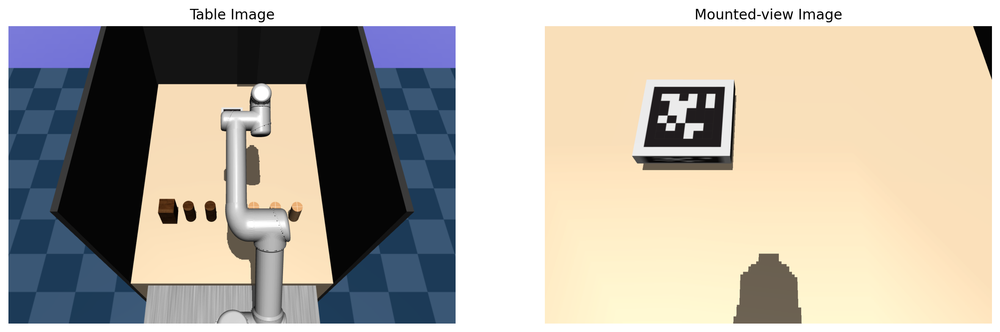

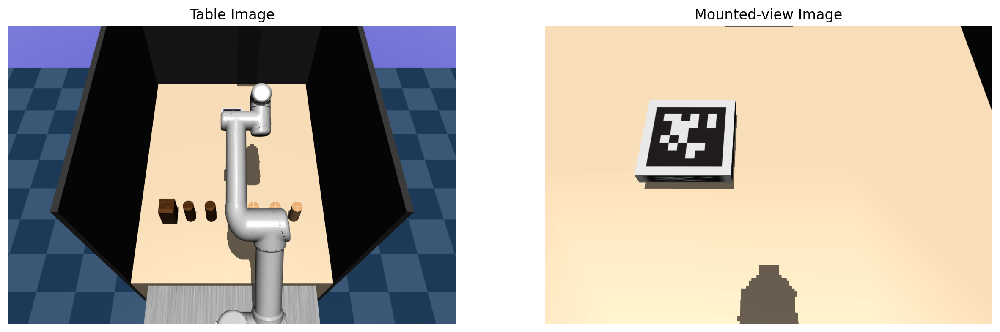

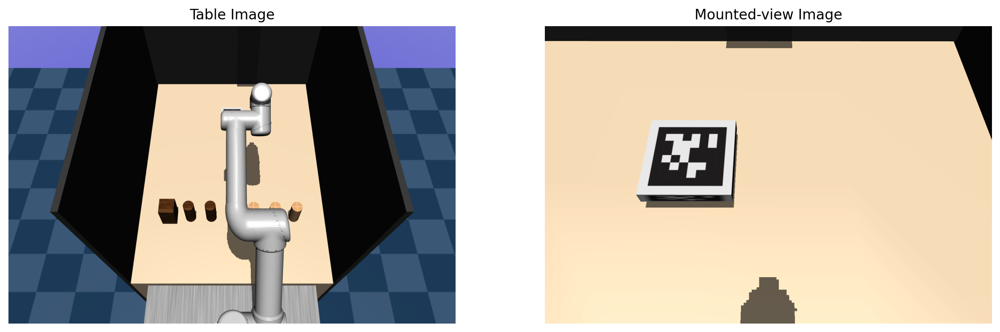

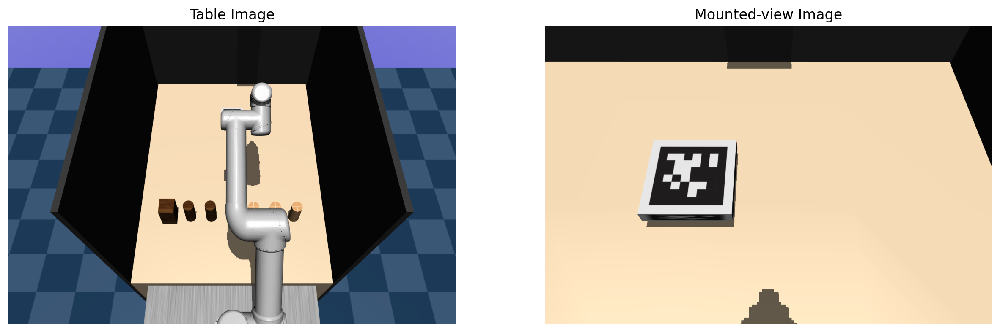

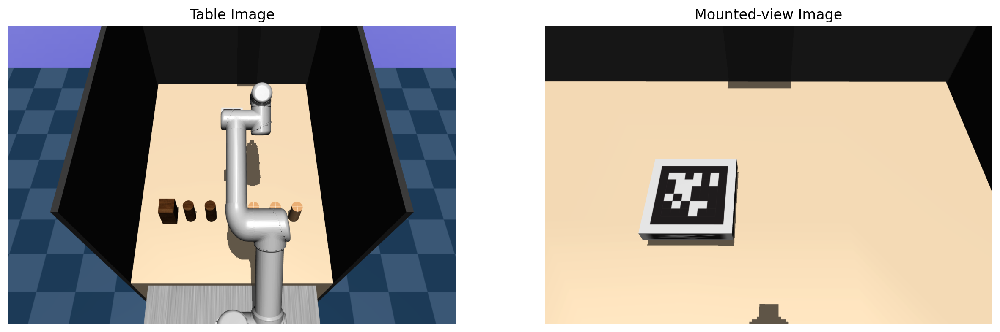

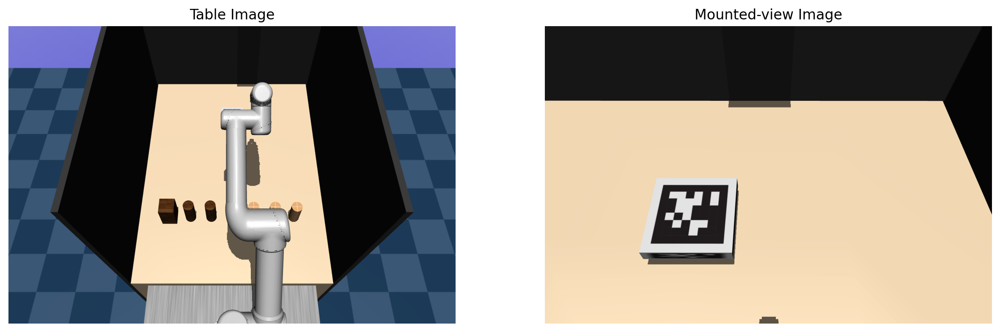

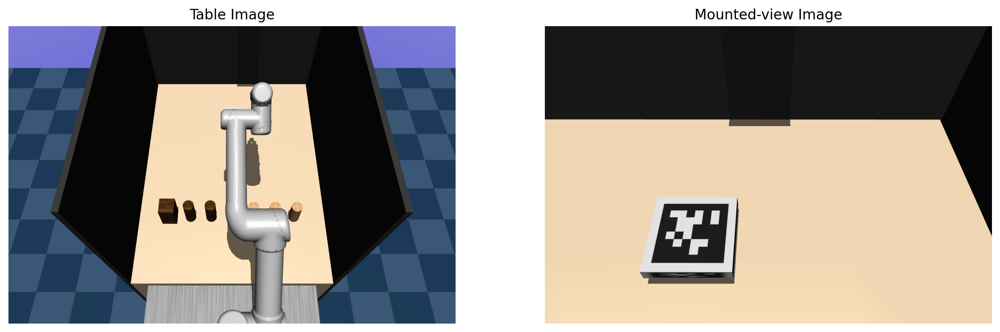

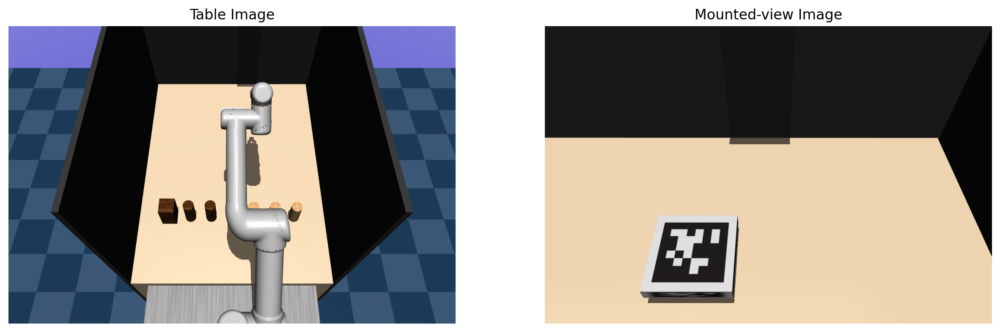

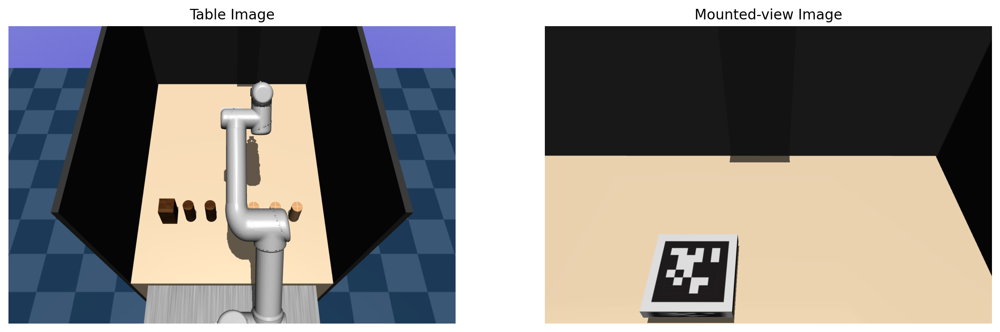

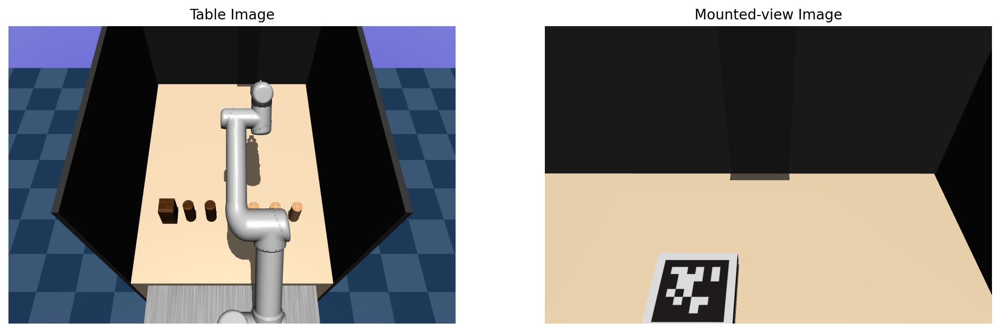

In [39]:
import math

bs2ee_list = []
tagpose_list = []

# delete all the markers.
del env.viewer._markers[:]

# Check available objects whose names start with 'obj_'
# Set objects behind of apriltag
obj_names = get_env_obj_names(env,prefix='obj_') # see objects
for obj_idx,obj_name in enumerate(obj_names):
    obj_pos   = [0.7,-0.3+0.1*obj_idx,0.8]
    obj_quat  = [0,0,0,1]
    set_env_obj(env=env,obj_name=obj_name,obj_pos=obj_pos,obj_quat=obj_quat,obj_color=None)

# Set AprilTag configurations
april_addr_z = env.sim.model.get_joint_qpos_addr('box_checker_z')
env.sim.data.qpos[april_addr_z] = -math.pi/2

max_tick = 10
env.tick = 0

while env.tick < max_tick:
    # Set Joint Configurations
    # init_configurations = [-math.pi/2, -3*math.pi/4, 3*math.pi/4, math.pi/2, math.pi/6-0.02*env.tick*math.pi, -math.pi/2 ]
    init_configurations = [-math.pi, -3*math.pi/4, -0.5+0.0022*env.tick*math.pi, -1.4+0.01*env.tick*math.pi, math.pi/2, 0]
    set_env_joint_configuration(env, init_configurations, prefix='ur_')

    # update object, robot configurations
    env.step()
    env.forward(INCREASE_TICK=False)

    # Get pose what I want to attach on.
    p_eef = env.get_p_body("ur_rg2_gripper_base_link")
    R_eef = env.get_R_body("ur_rg2_gripper_base_link")
    R_z = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,0,1]))
    R_coord    = R_eef # rpy2r(np.deg2rad([0,0,0]))

    # Add viewer coordinate marker.
    # env.add_marker_coordinate(
    #     p=p_eef,R=R_coord,axis_len=0.5,axis_width=0.01,label='Coordinate')
    
    R_z_rpy = np.degrees(r2rpy(R_z))
    
    # Arbitrary offset on camera btw arm.
    # arbi_offset = [0.0, 0, 0.10]
    arbi_offset = [0.0, 0, 0]

    # View Up-right the table.
    cam_table = env.set_cam_infos(cam_distance  = 1.0,
                        cam_azimuth   = 0,   # Z-axis: Yaw
                        cam_elevation = -60,      # X-axis: Roll                        
                        cam_lookat    = [0.5, 0, 1.5])  # arbitrary offset on camera.

    for _ in range(5):
        img_table = env.render_scene(mode='rgb_array', cam_infos=cam_table, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.imshow(img_table); plt.axis('off')
    plt.title("Table Image")

    # Follow Robot end-effector.
    cam_infos = env.set_cam_infos(cam_distance  = -0.10,
                        cam_azimuth   = R_z_rpy[2]+90,        # Z-axis: Yaw
                        cam_elevation = R_z_rpy[0]+90,      # X-axis: Roll                        
                        cam_lookat    = p_eef+arbi_offset)  # arbitrary offset on camera.

    # update object, robot configurations
    env.forward(INCREASE_TICK=False)

    for _ in range(2):
        img = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")
        img_depth = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=True, camera_name="track")
        img_real = np.array(env.depth2meters(img_depth))

    plt.subplot(1,2,2)
    plt.imshow(img); plt.axis('off')
    plt.title("Mounted-view Image")
    plt.show()

    # Get matrix A.
    tagpose = get_apriltag_pose(env, img, img_depth)
    tagpose_list.append(tagpose)

    # Get matrix B.
    bs2ee_matrix = get_homogeneous_matrix(env, from_link='ur_base_link', to_link='ur_rg2_gripper_base_link', verbose=False)
    bs2ee_list.append(bs2ee_matrix)

    # delete all the markers.
    del env.viewer._markers[:]


In [ ]:
p_eef

array([ 0.36, -0.06,  1.18])

In [ ]:
for i in range(len(q_list)):
    chain.joint[i].q = q_list[i]
    print(f"the {chain.joint[i].name}'s q value is : {chain.joint[i].q}")

# forward kinematics: correspond to each joint values.
chain.fk_chain(1)

p_eef = chain.joint[6].p
R_eef = chain.joint[6].R
# print(p_eef)

T_eef = cv2.hconcat((R_eef, p_eef))
T_eef = np.vstack((T_eef, np.array([0,0,0,1])))
print(T_eef)

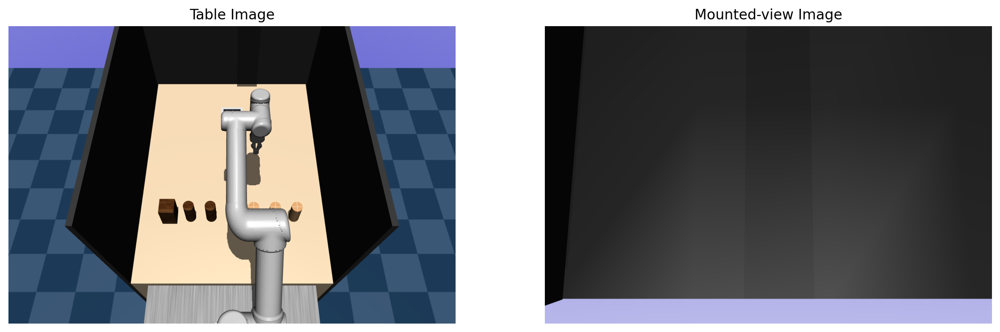

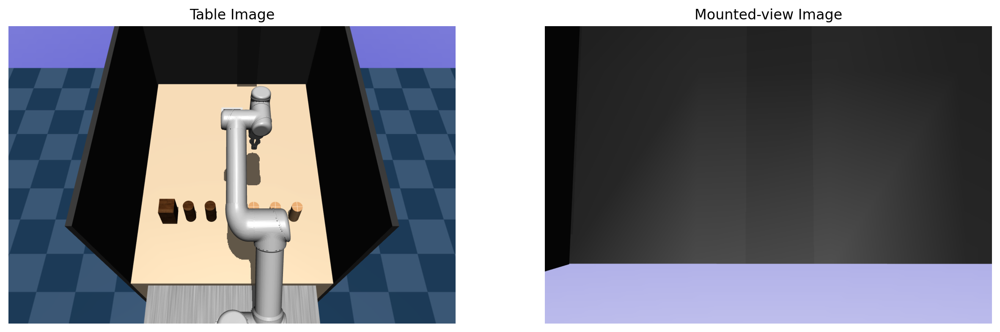

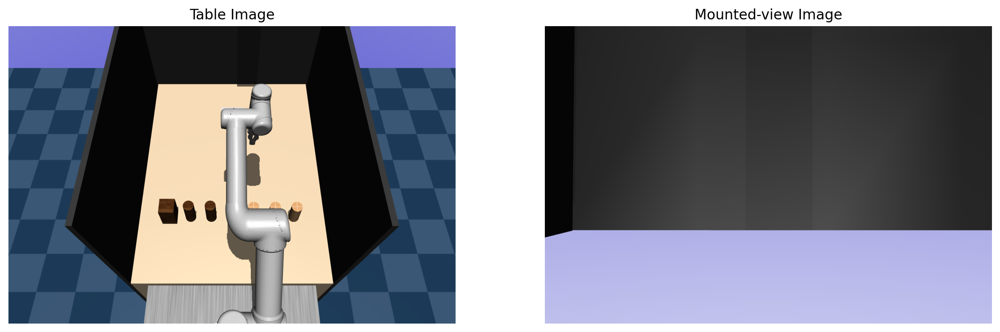

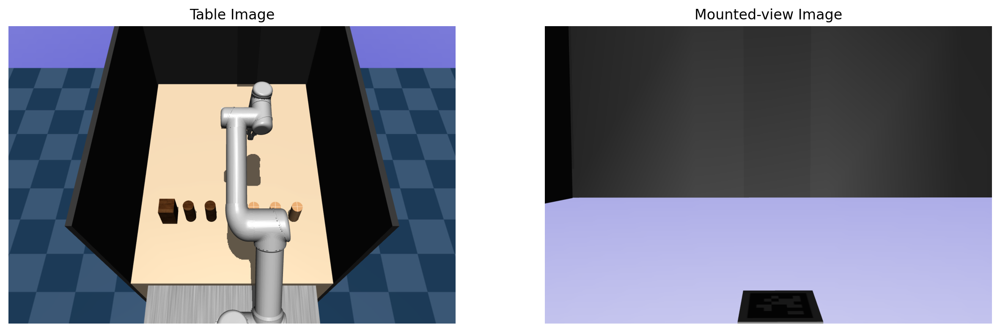

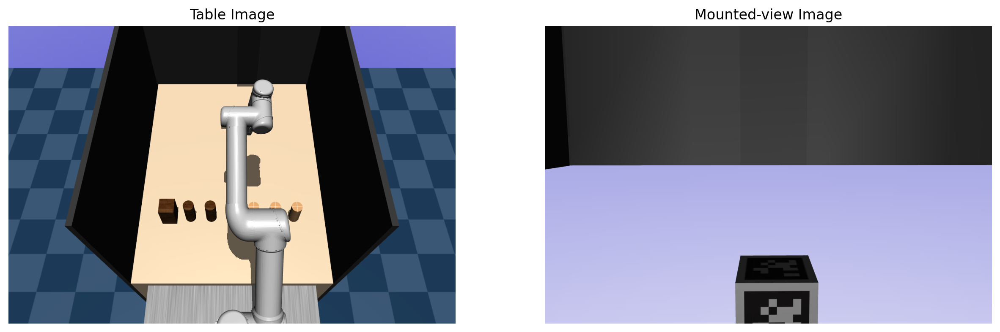

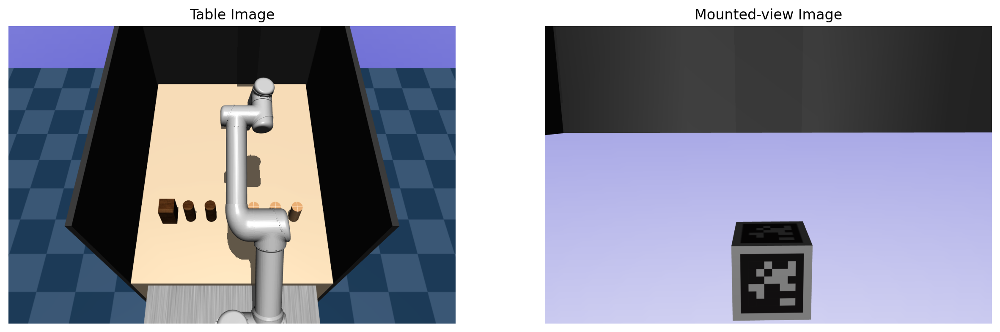

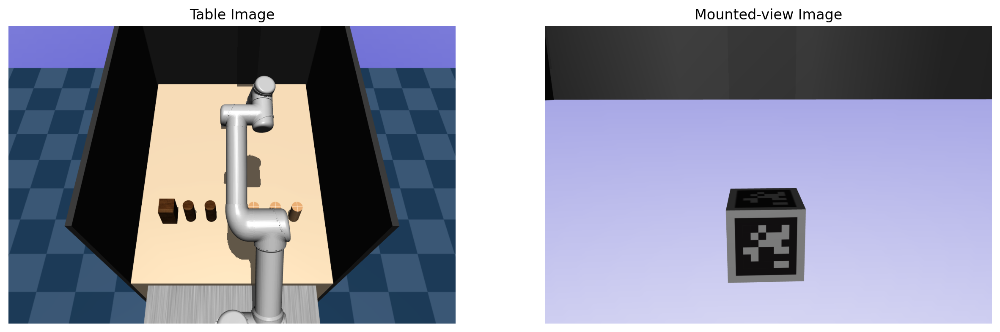

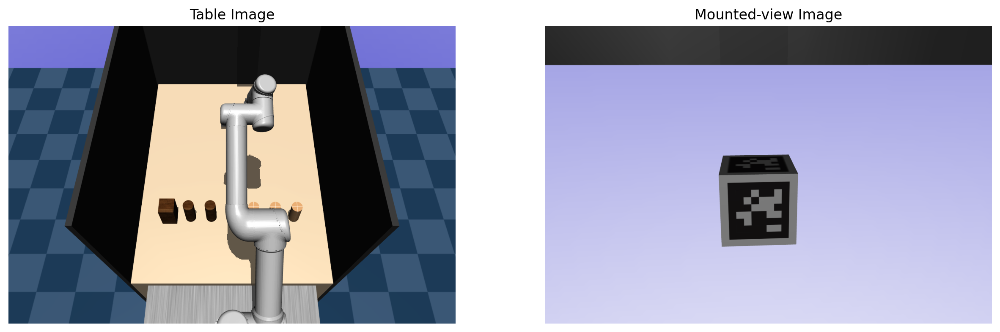

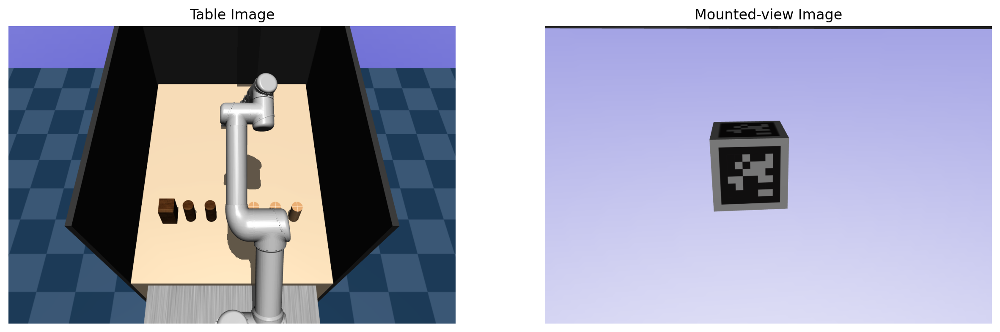

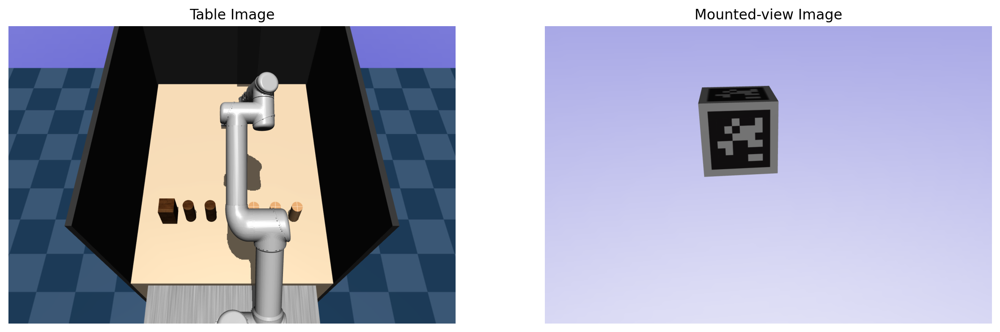

In [47]:
import math

bs2ee_list = []
tagpose_list = []

# delete all the markers.
del env.viewer._markers[:]

# Check available objects whose names start with 'obj_'
# Set objects behind of apriltag
obj_names = get_env_obj_names(env,prefix='obj_') # see objects
for obj_idx,obj_name in enumerate(obj_names):
    obj_pos   = [0.7,-0.3+0.1*obj_idx,0.8]
    obj_quat  = [0,0,0,1]
    set_env_obj(env=env,obj_name=obj_name,obj_pos=obj_pos,obj_quat=obj_quat,obj_color=None)

# Set AprilTag configurations
april_addr_z = env.sim.model.get_joint_qpos_addr('box_checker_z')
env.sim.data.qpos[april_addr_z] = -math.pi/2

max_tick = 10
env.tick = 0

while env.tick < max_tick:
    # Set Joint Configurations
    # init_configurations = [-math.pi/2, -3*math.pi/4, 3*math.pi/4, math.pi/2, math.pi/6-0.02*env.tick*math.pi, -math.pi/2 ]
    init_configurations = [-math.pi, -3*math.pi/4, -0.5+0.01*env.tick*math.pi, -2.0+0.01*env.tick*math.pi, math.pi/2+0.01*env.tick*math.pi, 0]
    set_env_joint_configuration(env, init_configurations, prefix='ur_')

    # update object, robot configurations
    env.step()
    env.forward(INCREASE_TICK=False)

    # Get pose what I want to attach on.
    p_eef = env.get_p_body("ur_rg2_gripper_base_link")
    R_eef = env.get_R_body("ur_rg2_gripper_base_link")
    R_z = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,0,1]))
    R_coord    = R_eef # rpy2r(np.deg2rad([0,0,0]))

    # Add viewer coordinate marker.
    # env.add_marker_coordinate(
    #     p=p_eef,R=R_coord,axis_len=0.5,axis_width=0.01,label='Coordinate')
    
    R_z_rpy = np.degrees(r2rpy(R_z))
    
    # Arbitrary offset on camera btw arm.
    # arbi_offset = [0.0, 0, 0.10]
    arbi_offset = [0.0, 0, 0]

    # View Up-right the table.
    cam_table = env.set_cam_infos(cam_distance  = 1.0,
                        cam_azimuth   = 0,   # Z-axis: Yaw
                        cam_elevation = -60,      # X-axis: Roll                        
                        cam_lookat    = [0.5, 0, 1.5])  # arbitrary offset on camera.

    for _ in range(5):
        img_table = env.render_scene(mode='rgb_array', cam_infos=cam_table, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.imshow(img_table); plt.axis('off')
    plt.title("Table Image")

    # Follow Robot end-effector.
    cam_infos = env.set_cam_infos(cam_distance  = -0.0,
                        cam_azimuth   = R_z_rpy[2]+90,        # Z-axis: Yaw
                        cam_elevation = R_z_rpy[0]+90,      # X-axis: Roll                        
                        cam_lookat    = p_eef+arbi_offset)  # arbitrary offset on camera.

    # update object, robot configurations
    env.forward(INCREASE_TICK=False)

    for _ in range(2):
        img = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")
        img_depth = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=True, camera_name="track")
        img_real = np.array(env.depth2meters(img_depth))

    plt.subplot(1,2,2)
    plt.imshow(img); plt.axis('off')
    plt.title("Mounted-view Image")
    plt.show()

    # Get matrix A.
    tagpose = get_apriltag_pose(env, img, img_depth)
    tagpose_list.append(tagpose)

    # Get matrix B.
    bs2ee_matrix = get_homogeneous_matrix(env, from_link='ur_base_link', to_link='ur_rg2_gripper_base_link', verbose=False)
    bs2ee_list.append(bs2ee_matrix)

    # delete all the markers.
    del env.viewer._markers[:]


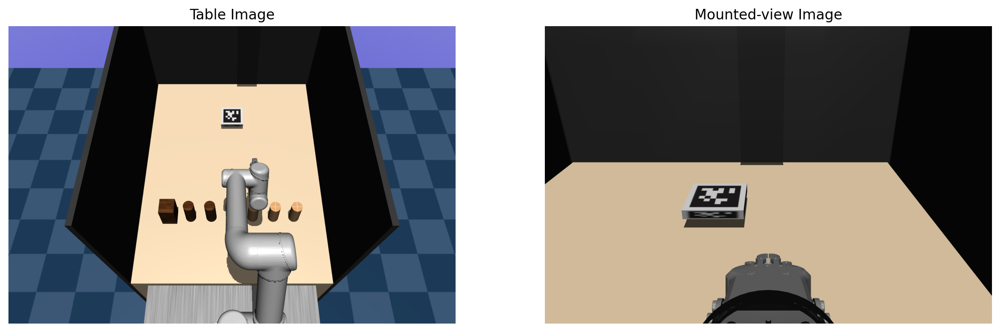

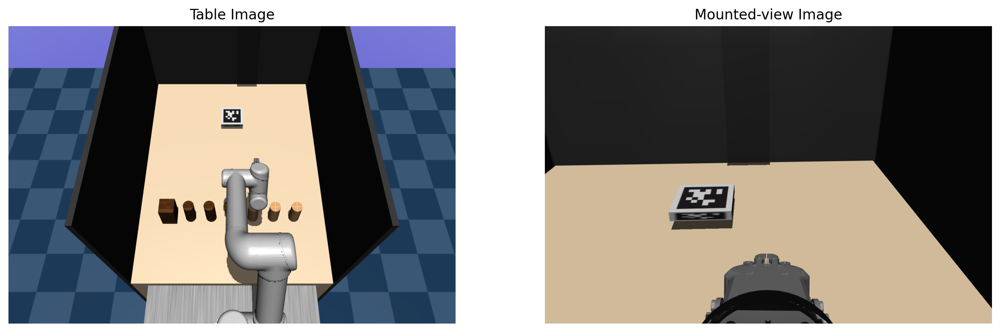

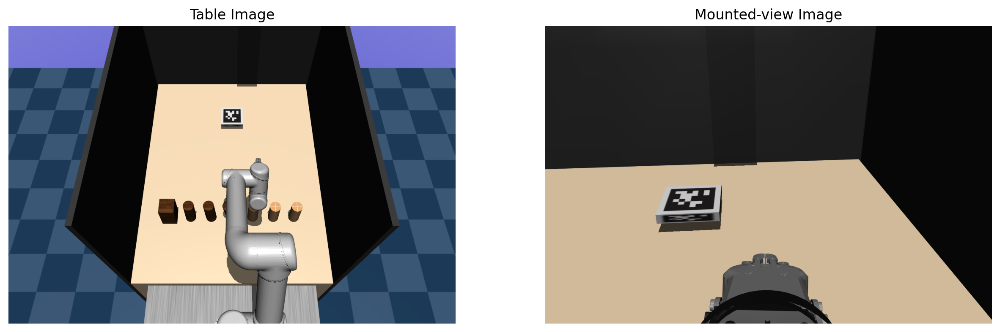

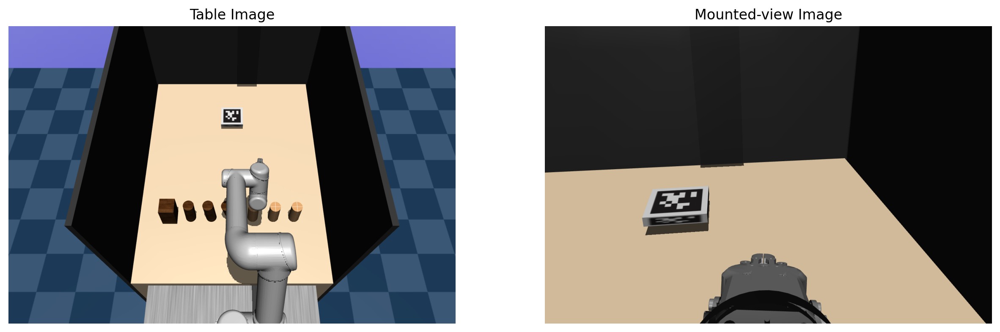

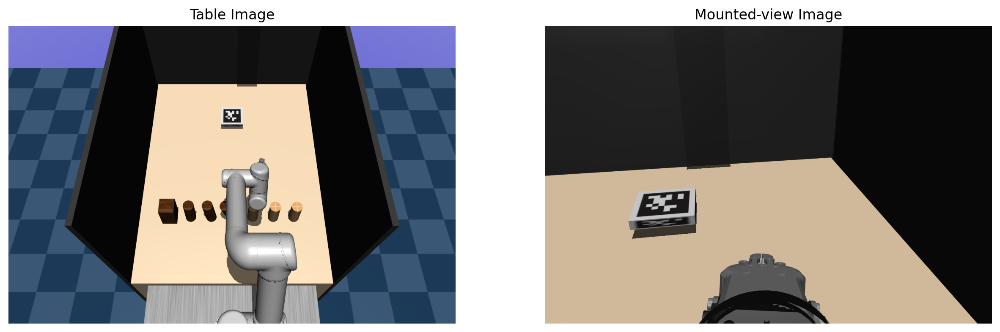

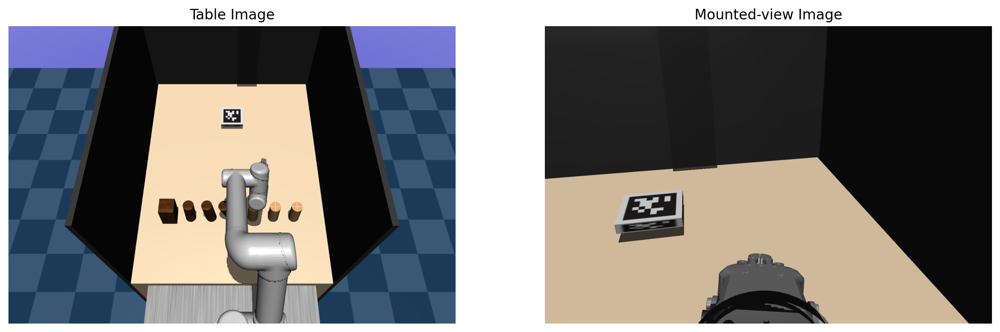

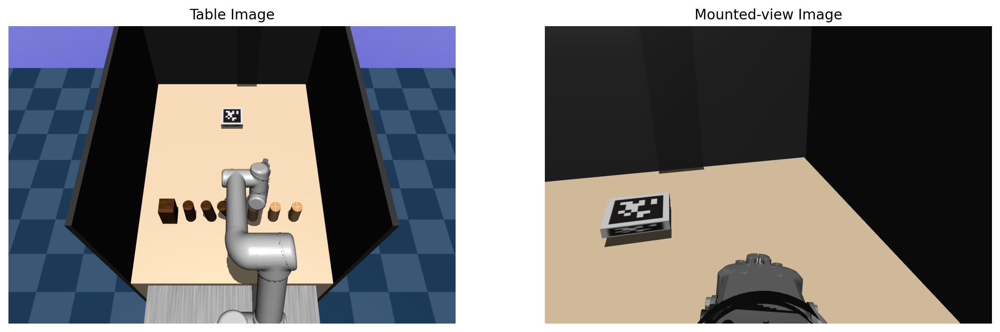

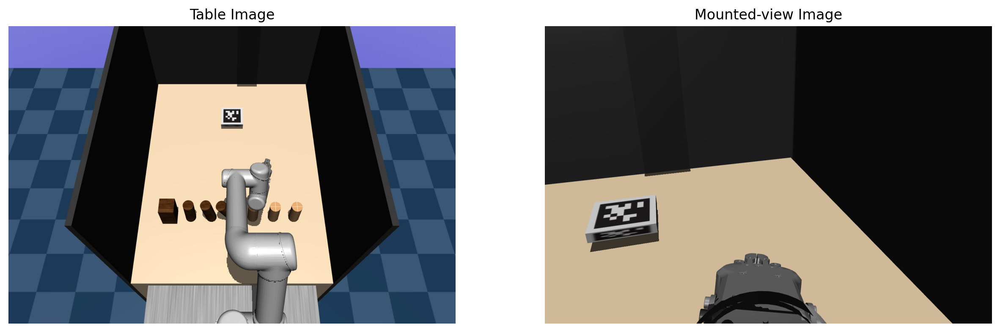

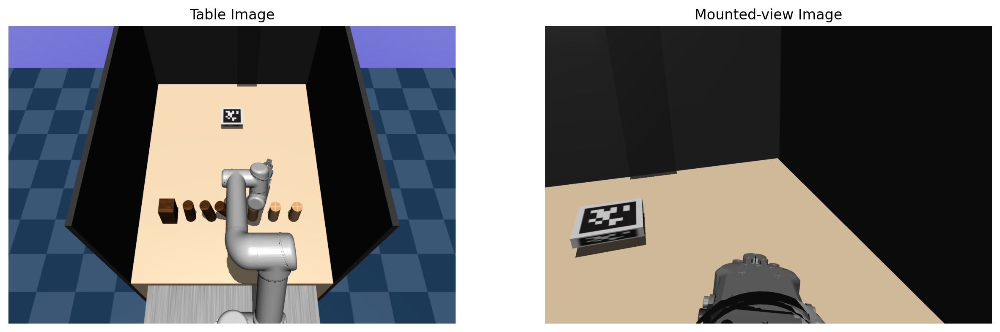

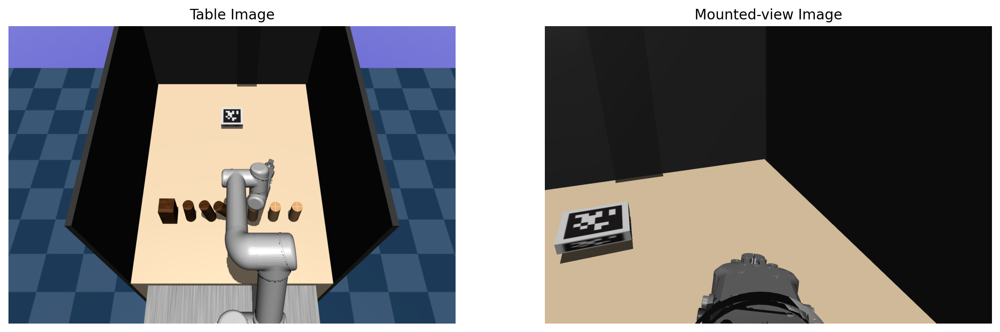

In [62]:
import math

bs2ee_list = []
tagpose_list = []

# delete all the markers.
del env.viewer._markers[:]

# Check available objects whose names start with 'obj_'
# Set objects behind of apriltag
obj_names = get_env_obj_names(env,prefix='obj_') # see objects
for obj_idx,obj_name in enumerate(obj_names):
    obj_pos   = [0.7,-0.3+0.1*obj_idx,0.8]
    obj_quat  = [0,0,0,1]
    set_env_obj(env=env,obj_name=obj_name,obj_pos=obj_pos,obj_quat=obj_quat,obj_color=None)

# Set AprilTag configurations
april_addr_z = env.sim.model.get_joint_qpos_addr('box_checker_z')
env.sim.data.qpos[april_addr_z] = -math.pi/2

max_tick = 10
env.tick = 0

while env.tick < max_tick:
    # Set Joint Configurations
    # init_configurations = [-math.pi/2, -3*math.pi/4, 3*math.pi/4, math.pi/2, math.pi/6-0.02*env.tick*math.pi, -math.pi/2 ]
    # init_configurations = [-math.pi, -math.pi, 0, -math.pi, -math.pi/2+0.01*env.tick*math.pi, +0.01*env.tick*math.pi]
    init_configurations = [-math.pi, -2.0, -math.pi/2, -math.pi, -math.pi/2+0.01*env.tick*math.pi, +0.01*env.tick*math.pi]
    set_env_joint_configuration(env, init_configurations, prefix='ur_')

    # update object, robot configurations
    env.step()
    env.forward(INCREASE_TICK=False)

    # Get pose what I want to attach on.
    p_eef = env.get_p_body("ur_wrist_3_link")
    R_eef = env.get_R_body("ur_wrist_3_link")
    R_z = R_eef@rpy2r(np.deg2rad([0,0,90]))@rpy2r(np.pi/2*np.array([0,0,1]))
    R_coord    = R_eef # rpy2r(np.deg2rad([0,0,0]))

    # Add viewer coordinate marker.
    # env.add_marker_coordinate(
    #     p=p_eef,R=R_coord,axis_len=0.5,axis_width=0.01,label='Coordinate')
    
    R_z_rpy = np.degrees(r2rpy(R_z))
    
    # Arbitrary offset on camera btw arm.
    arbi_offset = [0.0, 0, 0.10]
    # arbi_offset = [0.0, 0, 0]

    # View Up-right the table.
    cam_table = env.set_cam_infos(cam_distance  = 1.0,
                        cam_azimuth   = 0,   # Z-axis: Yaw
                        cam_elevation = -60,      # X-axis: Roll                        
                        cam_lookat    = [0.5, 0, 1.5])  # arbitrary offset on camera.

    for _ in range(5):
        img_table = env.render_scene(mode='rgb_array', cam_infos=cam_table, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")

    plt.figure(figsize=(15,5))
    plt.subplot(1,2,1)
    plt.imshow(img_table); plt.axis('off')
    plt.title("Table Image")

    # Follow Robot end-effector.
    cam_infos = env.set_cam_infos(cam_distance  = 0.05,
                        cam_azimuth   = R_z_rpy[2]+90,        # Z-axis: Yaw
                        cam_elevation = R_z_rpy[0]+180,      # X-axis: Roll                        
                        cam_lookat    = p_eef+arbi_offset)  # arbitrary offset on camera.

    # update object, robot configurations
    env.forward(INCREASE_TICK=False)

    for _ in range(2):
        img = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=False, camera_name="track")
        img_depth = env.render_scene(mode='rgb_array', cam_infos=cam_infos, width=env.render_width, height=env.render_height, depth_toggle=True, camera_name="track")
        img_real = np.array(env.depth2meters(img_depth))

    plt.subplot(1,2,2)
    plt.imshow(img); plt.axis('off')
    plt.title("Mounted-view Image")
    plt.show()

    # Get matrix A.
    tagpose = get_apriltag_pose(env, img, img_depth)
    tagpose_list.append(tagpose)

    # Get matrix B.
    bs2ee_matrix = get_homogeneous_matrix(env, from_link='ur_base_link', to_link='ur_rg2_gripper_base_link', verbose=False)
    bs2ee_list.append(bs2ee_matrix)

    # delete all the markers.
    del env.viewer._markers[:]
